<a href="https://colab.research.google.com/github/kimdonggyu2008/deep_daiv_-/blob/main/Audio_Deep_Learning_Week_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#제반 작업

In [ ]:
#데이터 연동
from google.colab import drive #드라이브를 연동하기 위한 코드로 https://jimmy-ai.tistory.com/14 에서 더 자세한 정보를 찾아볼 수 있다.
from google.colab import output
drive.mount("/content/gdrive")
import os #operation system의 줄임말로 데이터 디렉토리를 확인하는 등 작업을 수행할 수 있다.

#오디오
import librosa


#연산
import numpy as np
import pandas as pd

#시각화
import matplotlib.pyplot as plt
from IPython.display import Audio




Mounted at /content/gdrive


In [ ]:
m_path = "/content/gdrive/MyDrive/코딩공부/deep_daiv/dataset"

In [ ]:
!pip install python_speech_features
output.clear()

#오디오 딥러닝 트렌드

오디오 데이터는 그 특성상 이미지나 자연어에 비해 매우 방대하다. 예를 들면 28*28 = 784 개의 벡터로 이루어져 있는 MNIST 숫자 데이터셋에 비해, 오디오 딥러닝에 활용되는 음성 데이터는 1초당 최소 8800개 부터 많게는 44100개의 벡터로 이루어져 있다. 따라서 Computer Vision(이하 CV)나 Natural Language Procesing(이하 NLP)에 비해 모델 선택의 제약도 있고 그 발전 속도가 비교적 더디다. 연구 방법론 역시 CV나 NLP에서 파생된 것들을 차용하는 경우가 많다.

오디오 데이터는 그 수집도 다른 영역에 비해 까다롭다. ChatGPT, GPT4 등 NLP 영역에서 State-of-the-Art(이하 SOTA)를 달성하고 있는 GPT 기반 모델들은 커뮤니티, 포럼 등 다양한 웹사이트에서 그 데이터를 수집한다. 그러나 원한다면 3초만에 글을 공유할 수 있는 SNS나 커뮤니티 등이 오디오에는 부족하다. 오디오 데이터 소스가 많이 적다는 것이다. AI 작곡을 하기 위해 참고할 만한 음악을 구하고 싶어도 저작권 및 라이센스 문제로 쉽게 구할 수 없다.


그럼에도 불구하고 오디오 딥러닝이 중요한 이유는 많다. 말을 다루는 NLP와 시각(이미지, 영상 등)을 다루는 CV와 더불어 청각을 다루는 오디오는 더욱 더 '인간같은' 딥러닝을 위해 필수적이다. 멀티 모달(Multi-Modal), 즉 여러 영역의 딥러닝을 복합적으로 수행하는 방식의 딥러닝에서 오디오는 빠질 수 없는 존재이다. 일례로 음성 인식은 사람의 입모양을 볼 때 그 정확도가 훨씬 높아진다. 다음 장에서는 오디오 딥러닝을 통해 수행할 수 있는 여러 가지 일들에 대해 소개한다.



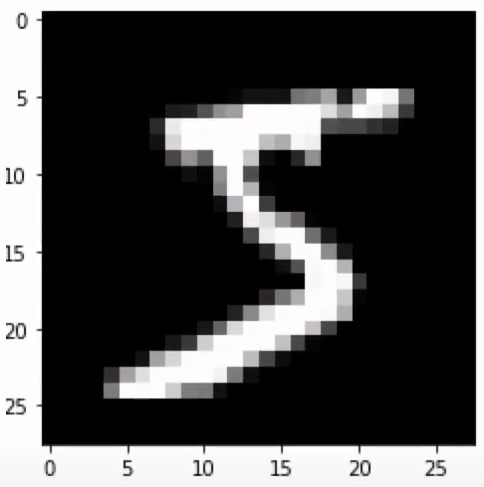

이미지: MNIST 숫자 데이터셋 중 일부



> Speech Recognition



  Apple Siri, Amazon Alexa 등에 활용되는 음성인식이다. 조용한 환경부터 시끄러운 환경에서도 적용할 수 있는 음성 인식, 특정 사용자 음성 인식, 유튜브 자동 자막 생성 등 그 활용 방향은 굉장히 다양하다. 오디오 딥러닝 영역에서 가장 많이 연구되고 있는 분야이다. Automatic Speech Recognition(ASR)이나 Speech-to-Text(STT)라고도 불린다. 이번 공개 스터디에서 다룰 내용 중 하나이다.


> Text-To-Speech(TTS)

  사용자가 글을 입력하면 그 글을 음성화한다. Apple Siri에 쓰이는 기술로 AI 어시스턴트 등이 대표적 활용처이다. 특정 목소리를 합성해내는 Speech Synthesis와 함께 활용되면 다양한 사람의 목소리로 다양한 말들을 할 수 있다.
  Speech Synthesis란 CLOVA 등이 선보이고 있는 기술로 사람의 목소리를 재현해내는 일이다. 음성을 변조하는 것부터 죽은 사람의 목소리를 불러오는 것까지 음성을 다양한 방식으로 합성한다. 최근 "가상인간 로지", "AI가 부활시킨 김광석", "브루노 마스가 부른 Hype Boy" 등으로 세간의 관심을 끌었다. 이번 공개 스터디에서 중점적으로 다룰 내용 중 하나이다.


> Audio Classification

  오디오 레이블을 분류해 내는 작업이다. 발화자를 구분해 내는 것부터 악기 소리를 구분하는 것까지 굉장히 다양한 방식으로 활용되고 있다. 하위 개념으로는 Sound Event Detection(SED)이 있는데 이는 녹음 환경으로부터 음성을 찾아내는 기술이다. 숲의 생물다양성을 파악하는 데 있어 CV(Computer Vision)를 이용해 한정된 장소를 시각적으로 모니터링하는 방식보다 숲의 소리를 그대로 녹음한 뒤 새 울음소리 등을 SER을 통해 찾아내는 방식으로 개체들의 종류를 파악해 내는 것이 효율적이다.

> Audio Source Separation

  녹음 음성을 다양한 음원으로 분리한다. 수많은 사람들이 대화를 하는 환경 속에서 특정인의 발화 내용만 파악하기 위해서 발화자 단위로 음원을 분리하는 작업이 그 예시이다. Cocktail party problem 등 영역에 활용되는 기술이다. 이번 공개스터디에서 다룰 내용이다.

> Music Generation

  AI 작곡, 배경음악 만들기 등의 기술이다. Text-to-Music 등이 여기에 해당한다.

> 기타

  상기한 5가지 영역 이외에도 사람의 목소리를 듣고 감정을 파악하는 Emotion Recognition, 음원의 음질을 향상하는 Audio Denoising, NLP를 함께 활용하여 녹음 음성의 설명 자막을 다는 Audio Captioning, 변조, 합성 등 가상의 목소리로부터 사람의 진짜 목소리를 구분해내는 Anti Spoofing
  등 다양한 영역으로 오디오 딥러닝은 발전해 나가고 있다.






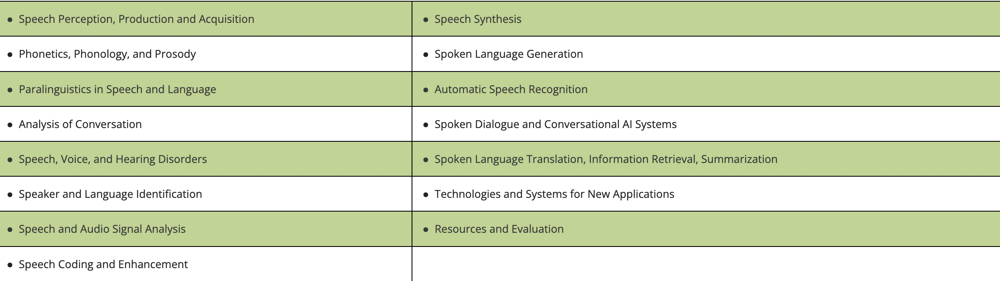

위 사진은 음성신호처리 및 Speech Deep Learning 관련 최대 규모 학회 중 하나인 InterSpeech 2023의 주요 연구 주제이다.

#오디오 데이터란?




오디오 데이터는 Time(시간)에 따른 Wave(파동)의 연속적인 주기함수로 정의할 수 있다. 이러한 Waveform(오디오 신호 함수)에서 우리는 다음과 같은 정보를 얻을 수 있다.

- Amplitude(진폭)
- Frequency(주파수)
- Phase(위상)


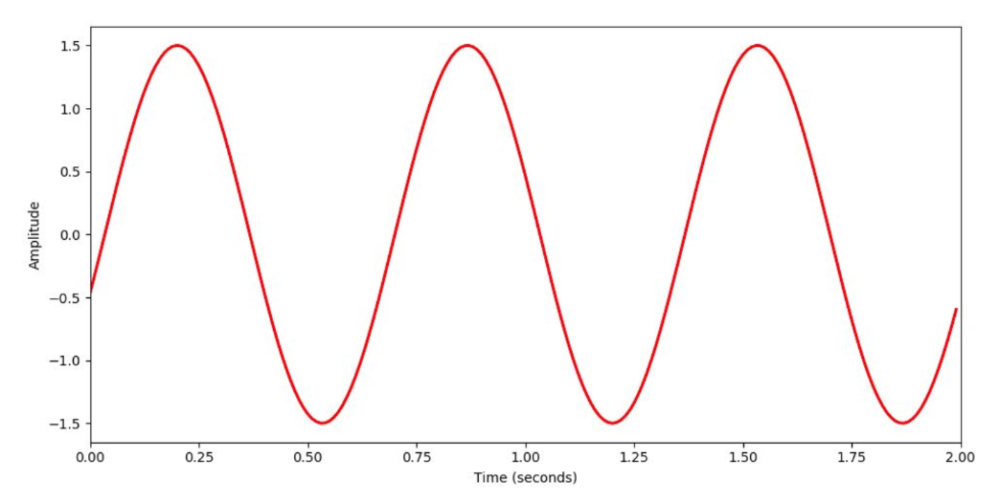

위 그림과 같이 생긴 Raw audio를 뜯어보면 Y축은 **amplitude(진폭)**, X축은 **time(시간)**인 Waveform(파형)그래프를 형성할 수 있다.

주파수(단위: Hz)는 마루에서 마루, 혹은 골에서 골까지로 정의되는 주기가 1초에 몇 번 반복되는가를 의미하며 1초에 100번의 주기가 반복되는 것을 100Hz로 정의한다. 이 주파수가 높다는 것은 진동수가 많다는 것으로
곧 High-pitch(고음역)의 소리를 의미한다.

참고로, 인간의 가청 주파수는 20Hz~20kHz이며 4옥타브 라(A)의 경우 440Hz, 즉 1초에 440번 진동하는 파형이다.



#Audio Data Sampling

컴퓨터에서 오디오 데이터를 처리하기 위해서는 연속적이었던 Raw audio(원본 데이터)를 Discretize(이산화)할 필요가 있다. Raw audio의 X축인 time(시간)을 일정 단위로 쪼개어 값들을 추출하는데 되는데 이 과정을 **sampling** 이라고 부른다. 초당 sampling을 수행하는 횟수를 **Sampling rate**라고 한다.

잘게 쪼개진 매 frame 마다의 특징값을 추출하게 되면 우리의 오디오 데이터는 매 초 Sampling rate 개만큼의 특징값을 가진 벡터로 Discretize(이산화)된다.


참고로, 음성 데이터의 가장 표준적인 Sampling rate는 44.1kHz로 이는 CD의 Sampling rate이다.
통화에서는 보통 8000Hz, 오디오 딥러닝 모델에서는 주로 22.05kHz를 이용한다.

**대체로** Sampling rate가 높으면 고품질의 음성을 재생해 낼 수 있으나 특정 수준 이상의 Sampling rate부터는 일반인이 차이를 쉽게 구분할 수 없다. Sampling rate가 높아지면 처리해야 하는 데이터의 개수가 늘어나기에 딥러닝 모델의 성능과 속도간의 Trade-off 를 잘 이해하고 Sampling rate을 설정해야 한다.

참고로, Nyquist Theorem(나이퀴스트 이론)은 다루는 오디오 데이터 내 최대 주파수의 두 배 이상에 해당하는 Sampling rate으로 샘플링하면 오디오를 완벽히 복원할 수 있다는 이론이다.


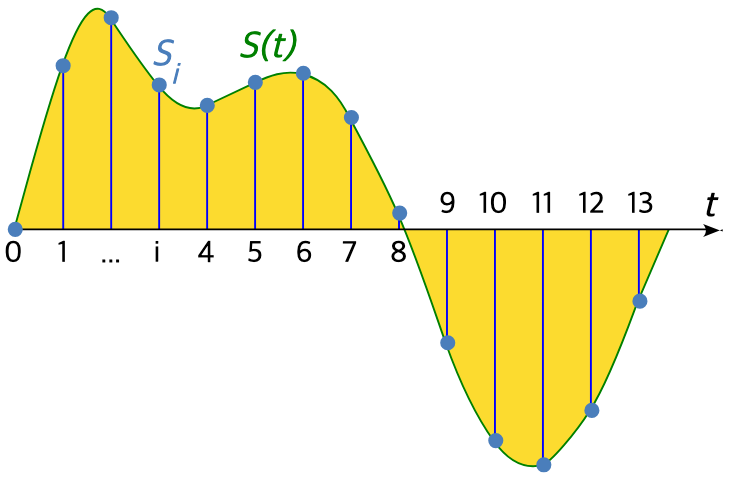

[이미지 출처](https://en.wikipedia.org/wiki/Sampling_%28signal_processing%29)

##Librosa를 이용한 Sampling & Visualizing & Audiolizing & More

Librosa는 파이썬에서 제공하는 음성 분석을 위한 패키지이다.

In [ ]:
nutcrack = librosa.example("nutcracker") #librosa 에서 제공하는 예시 음성
y, sr = librosa.load(nutcrack) #y는 sampling한 특징값들, sr은 sampling rate.

In [ ]:
print("Audio shape is : ", y.shape, "sampling rate: ", sr)

print("Total duration of Audio is :", round(y.shape[0]/22050, 5), "sec") #데이터를 sampling rate으로 나누어주는 것은 그 단위를 초로 보겠다는 의미이다.
#지정한 자리수로 반올림

Audio shape is :  (2643264,) sampling rate:  22050
Total duration of Audio is : 119.87592 sec


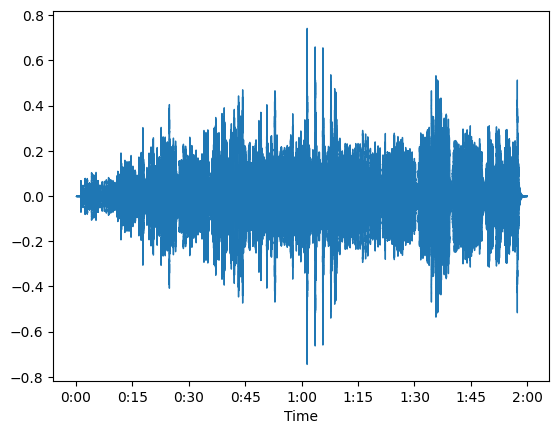

In [ ]:
#Waveform 형태로 오디오 시각화하기
librosa.display.waveshow(y, sr = sr) #https://librosa.org/doc/main/generated/librosa.display.waveshow.html

In [ ]:
#오디오 재생
Audio(data = y, rate = sr)

In [ ]:
#Resampling을 수행해 보자. 이 상황에서는 샘플의 개수를 낮추었으니 Downsampling을 수행한 셈이다.
y_8800k = librosa.resample(y, orig_sr = sr, target_sr = 8800)
Audio(data = y_8800k, rate = 8800)

#오디오 데이터에 대한 이해

##정현파와 화음

In [ ]:
#Sinusoidal(정현파) 의 이해
#정현파는 사인함수의 기하학적 그래프로 모든 음성은 각 주파수 대역에서 진동하는 수많은 정현파의 가중합으로 구성된다.
#'E5(미), A4(라)' 라는 두 개의 음으로 이루어진 화음을 만들어 보자.

#각 계이름별 '메인 주파수
f_A = 440
f_E = 659
#각 계이름별 amplitude 계수
w_A = 0.5 #최대 진폭 지정
w_E = 0.5
#Sampling rate. 초당 22050번 샘플링한다.
fs = 22050


def sinusoid(w, f0, phi, fs, time):
  t = np.arange(0, time, 1/fs) #arange는 (시작점, 끝점, 간격)으로 이루어진 값들을 반환한다. ex)np.arange(0, 10, 1) = [0, 1, 2, ..., 10]
  x = w * np.cos(2*np.pi*f0*t+phi) #2*파이 * 기본진동수 + 페이즈(위상)
  #삼각함수의 주기는 2*np.pi/abs(b)이기 때문에 이 함수는 t를 변수로 갖고 +w, -w을 각각 최댓값, 최솟값으로 가지며 주기가 1/f0만큼의 함수이다.
  #주기가 1/f0이라는 것은 1초에 f0번 흔들린다는 뜻이고 이 f0은 곧 주파수가 된다.
  return x

사인파 생성 예시


In [ ]:
y_A = sinusoid(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01 ) #진폭, 기본진동수, 위상, 샘플링레이트, 생성길이 지정
y_E = sinusoid(w_E, f0= f_E, phi = np.pi/2, fs = fs, time = 0.01 )
print(y_A.shape, y_E.shape)
#Sampling rate이 22150이기 때문에 0.01초는 약 221 프레임을 의미한다.

(221,) (221,)


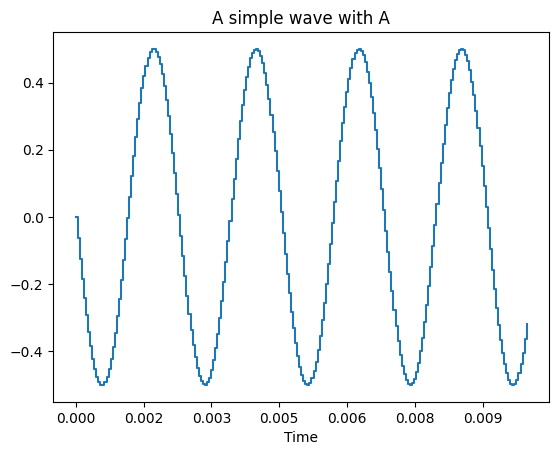

In [ ]:
plt.title("A simple wave with A")
librosa.display.waveshow(y_A, sr = sr)

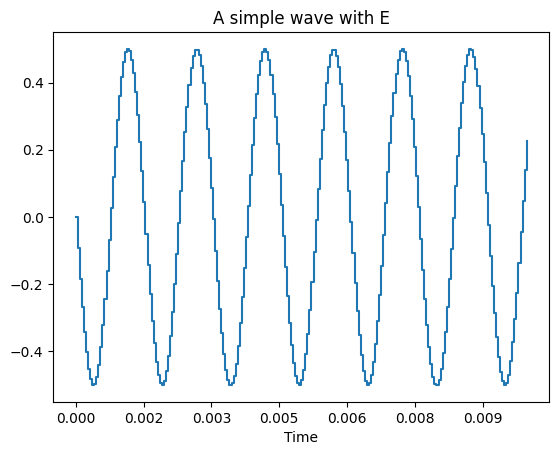

In [ ]:
plt.title("A simple wave with E")
librosa.display.waveshow(y_E, sr = sr)

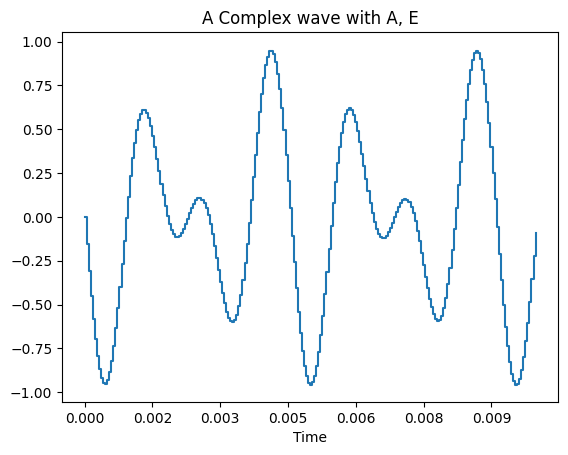

In [ ]:
#두 개의 정현파를 단순히 더하면 화음을 만들 수 있다. 눈여겨보아야할 점은 두 함수의 합 역시 주기함수라는 것이다.
#함수의 합은 그냥 +로 실행가능함
plt.title("A Complex wave with A, E")
librosa.display.waveshow(y_A+y_E, sr = sr)

In [ ]:
#위에서 시각화한 A4와 E5의 화음을 들어보자.
y_A = sinusoid(w = 0.2, f0= f_A, phi = np.pi/2, fs = fs, time = 2 )#2초짜리 만들어서 더함
y_E = sinusoid(w = 0.2, f0= f_E, phi = np.pi/2, fs = fs, time = 2 )
Audio(data = (y_A+y_E), rate = sr)

In [ ]:
#세기(Amplitude)를 다르게 하여 더해보았다.
y_A = sinusoid(w = 0.2, f0= f_A, phi = np.pi/2, fs = fs, time = 2 )#각각의 진폭(볼륨 다르게 함)
y_E = sinusoid(w = 2.0, f0= f_E, phi = np.pi/2, fs = fs, time = 2 )
Audio(data = (y_A+y_E), rate = sr)
#참고로 위 셀과 weight가 다름에 불구하고 볼륨이 똑같은 것은 ipython.display.Audio 패키지 특성상 input을 자동으로 정규화(Normalize)하기 때문이다.

In [ ]:
#한 옥타브의 차이는 곧 주파수가 2배 차이난다는 것을 의미한다.
#주파수를 2로 나누어주면 같은 음인데 한 옥타브 아래에서 소리가 나게 된다.
y_A = sinusoid(w = 0.2, f0= f_A/2, phi = np.pi/2, fs = fs, time = 2 )#각 기본진동수를 반으로 나눠서 옥타브 내림
y_E = sinusoid(w = 0.2, f0= f_E/2, phi = np.pi/2, fs = fs, time = 2 )
Audio(data = (y_A+y_E), rate = sr)

##주파수에 대한 이해

**왜 한 옥타브 위의 소리는 주파수가 두 배일까?** 아래 피아노 음계에서 볼 수 있듯 한 옥타브는 총 12개의 음으로 구성되어 있다. 각 반음계마다(Ex. C->C#) 약 1.05946의 승수로 주파수가 커진다. C4->C5로 가기 위해 기존 주파수에 1.05946을 12번 곱하면 2가 되고 따라서 한 옥타브마다 주파수는 두 배로 커지는 것이다.


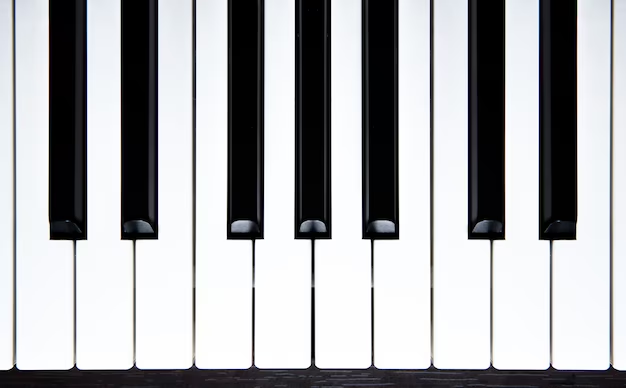

In [ ]:
#2에 매우 근접한 것을 확인할 수 있다.
1.05946**12

1.9999299046559322

In [ ]:
#어떤 음이든 구현할 수 있는 함수를 만들어 보자.
def any_pitch(step, towards = "up", m = 1.05946, orig_f = 220): #시작음을 A라고 가정, towards는 음 변화 방향, m은 승수, orig_f는 시작음, 220이므로 A3을 의미한다.
  if towards == "up":
    f_shift = orig_f*(m**step)#피치를 기본 주파수** 1/12만큼 이동가능함

    return sinusoid(w = 0.4, f0 = f_shift,
                    phi = np.pi/2, fs = fs, time = 2 )

  elif towards == "down":#올라가는 것, 내려가는 것 둘 다 똑같은 방식
    f_shift = orig_f*(m**(-1*step))

    return sinusoid(w = 0.4, f0 = f_shift,
                    phi = np.pi/2, fs = fs, time = 2 )

In [ ]:
#먼저 원래 음인 A3을 제작한다.
y_A = sinusoid(w = 0.4, f0= 220, phi = np.pi/2, fs = fs, time = 2 )
Audio(data = y_A, rate = sr)

In [ ]:
#두 키 업. 즉 B3
Audio(data = any_pitch(step = 2, towards = "up"), rate = sr)

In [ ]:
#한 옥타브 업. 즉 A4 ~ 440Hz
Audio(data = any_pitch(step = 12, towards = "up"), rate = sr)

In [ ]:
#A3음, C#4음, E4음을 바탕으로 A Major 코드 만들어 보기.
y_A = sinusoid(w = 0.4, f0= 220, phi = np.pi/2, fs = fs, time = 2 ) #A3
y_CC = any_pitch(4) #C#4
y_E = any_pitch(7) #E4
Audio(data = (y_A+y_E+y_CC), rate = sr)#각각 만들어서 합쳐서 만듦

##위상

위상이란 진폭(Amplitude)과 주파수(Frequency)와 더불어 아날로그 파형을 구성하는 3대 요소 중 하나로 파동 그래프의 모양을 의미한다. 오디오 딥러닝에서는 위상을 Sinusoid 그래프의 시작 기울기로 표현한다.

In [ ]:
def sinusoid_phase(w, f0, phi, fs, time, phase):
  t = np.arange(0, time, 1/fs)
  x = w * np.cos(2*np.pi*f0*t+phi*phase) #phi*phase는 평행이동의 정도를 의미하고 삼각함수에서 평행이동의 정도는 곧 x = 0에서의 미분계수(시작 각도)를 결정한다.
  return x

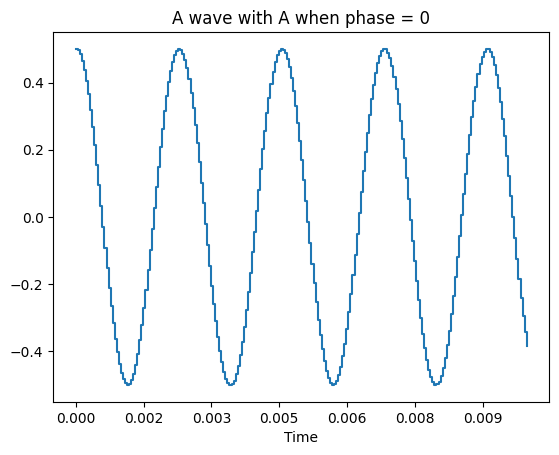

In [ ]:
#0도 위상
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 0)
#위상이 파이/2 * 0만큼 이동하기에 코사인 모양을 가지게 됨
plt.title("A wave with A when phase = 0")
librosa.display.waveshow(y_A, sr = sr)

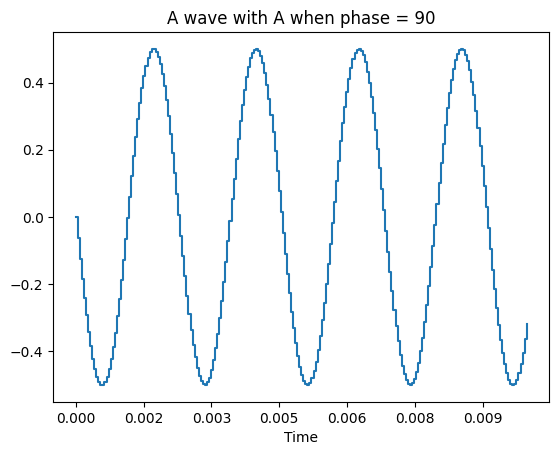

In [ ]:
#90도 위상
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 1 )
#페이즈 파이/2*1만큼 이동함
plt.title("A wave with A when phase = 90")
librosa.display.waveshow(y_A, sr = sr)

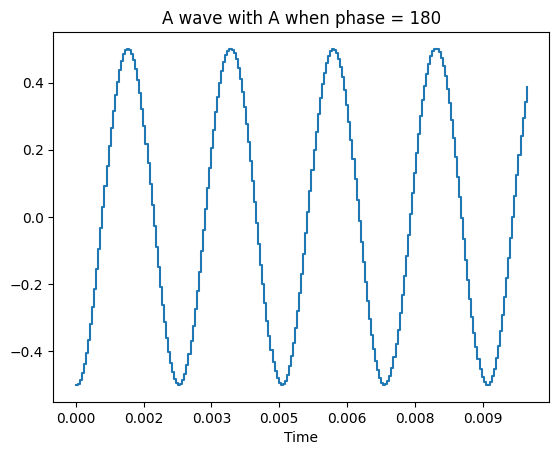

In [ ]:
#180도 위상
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 2)
#위상이 파이/2*2만큼 이동해서 반대로 뒤집어짐
plt.title("A wave with A when phase = 180")
librosa.display.waveshow(y_A, sr = sr)

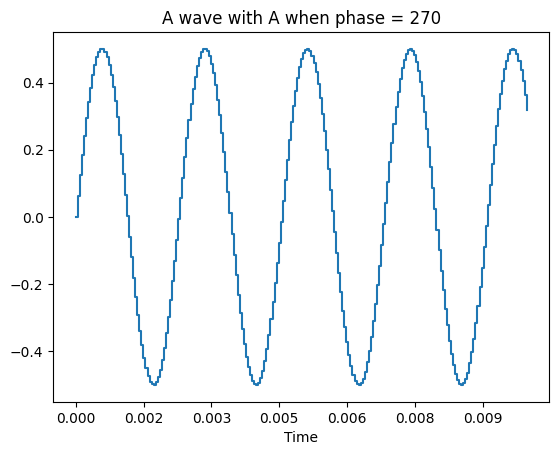

In [ ]:
#270도 위상
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 3)
plt.title("A wave with A when phase = 270")
librosa.display.waveshow(y_A, sr = sr)

  역위상이란 0도와 180도, 90도와 270도와 같이 위상이 정확히 180도 차이나는 현상을 의미한다. 역위상의 파동 두 개가 만나면 위상 상쇄(Phase Cancellation)현상이 발생한다. 해당 파동의 주파수가 상쇄돼 들리지 않게 되고 음성이 왜곡되어 출력된다. 한편 위상이 일치하면 음압이 커져 소리가 풍성하게 들린다.

In [ ]:
#입력 그래프를 x축 대칭해 역위상 구현하는 함수 만들기.
def inverse_phase(wave):
  return (-1)*wave #역으로 바꿈

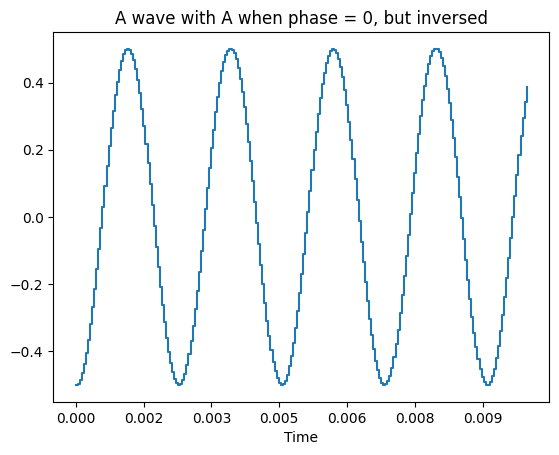

In [ ]:
#역위상 그래프 그리기
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 0)
#위상 0인 사인파의 위상
inverse_yA = inverse_phase(y_A)
plt.title("A wave with A when phase = 0, but inversed")
librosa.display.waveshow(inverse_yA, sr = sr)

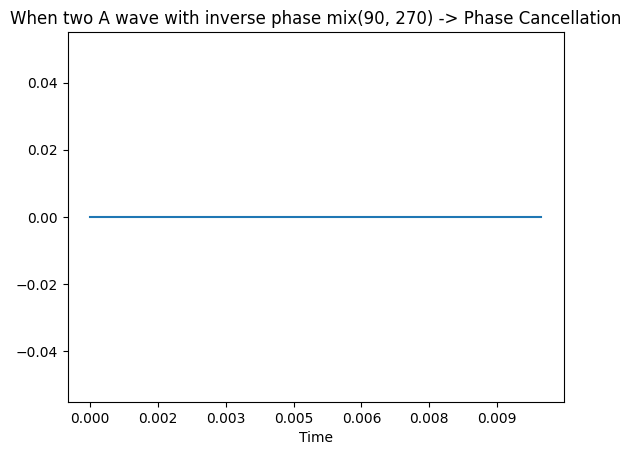

In [ ]:
#역위상 파동의 위상 상쇄 현상
y_A = sinusoid_phase(w_A, f0= f_A, phi = np.pi/2, fs = fs, time = 0.01, phase = 3)
#90도인 사인과 270도는 180도가 차이나는 역위상이므로 상쇄됨
inverse_yA = inverse_phase(y_A)
plt.title("When two A wave with inverse phase mix(90, 270) -> Phase Cancellation")
librosa.display.waveshow(y_A+inverse_yA, sr = sr)

In [ ]:
#위상 상쇄 현상으로 아무 소리도 들리지 않는 것을 볼 수 있다.
y_A = sinusoid_phase(w_A, f0= f_A/2, phi = np.pi/2, fs = fs, time = 2, phase = 0)
inverse_yA = inverse_phase(y_A)
Audio(data = y_A+inverse_yA, rate = sr)

/usr/local/lib/python3.10/dist-packages/IPython/lib/display.py:174: RuntimeWarning: invalid value encountered in divide
  scaled = data / normalization_factor * 32767
/usr/local/lib/python3.10/dist-packages/IPython/lib/display.py:175: RuntimeWarning: invalid value encountered in cast
  return scaled.astype("<h").tobytes(), nchan


#푸리에 변환(Fourier Transform)

Time-domain으로 이루어진 데이터를 있는 그대로 분석하는 것은 상당히 비효율적이다. 음성 인식, 음성 합성 등 개별 음성의 특성을 세밀하게 분석해야 하는 오디오 딥러닝 tasks를 수행하기 위해서는 '음색' 에 대한 면밀한 학습이 필요한데, 이러한 음색을 분석하기 위해서 Fourier Transform을 활용해 기존의 오디오 데이터를 수정한다.


Mel Spectrogram, MFCC 등 오디오 데이터의 Features를 효과적으로 표현하기 위한 방법론이 여러 개 있으나 이러한 방법론들은 모두 time-domain의 원본 음성을 frequency-domain으로 바꾸어주는 Fourier Transform(푸리에 변환)에 기초한다. 본 Fourier Transform의 수식은 [여기](https://www.youtube.com/watch?v=RxbkEjV7c0o)를 참고해 작성하였다.

## Fourier Transform Intuition & Math

Fourier transform 은 위에서 이야기했듯이 Time domain의 원본 음성 데이터를 Frequency domain으로 옮기는 과정이다. 이를 직관적으로 이해하기 위해 다음과 같은 예시를 떠올려 보자. 바닷가에 놀러갈 때 해안가에서 우리가 보는 파도는 인근 물고기떼의 헤엄, 멀리서 불어온 바람, 원양의 선박의 움직임 등으로부터 복합적인 영향을 받는다. 이러한 파도의 발생 요인들을 개별적으로 규명해내 해안가의 파도는 어떻게 만들어졌는지 파악할 수 있게 해주는 수학적인 방법론이 fourier transform이라고 할 수 있다.




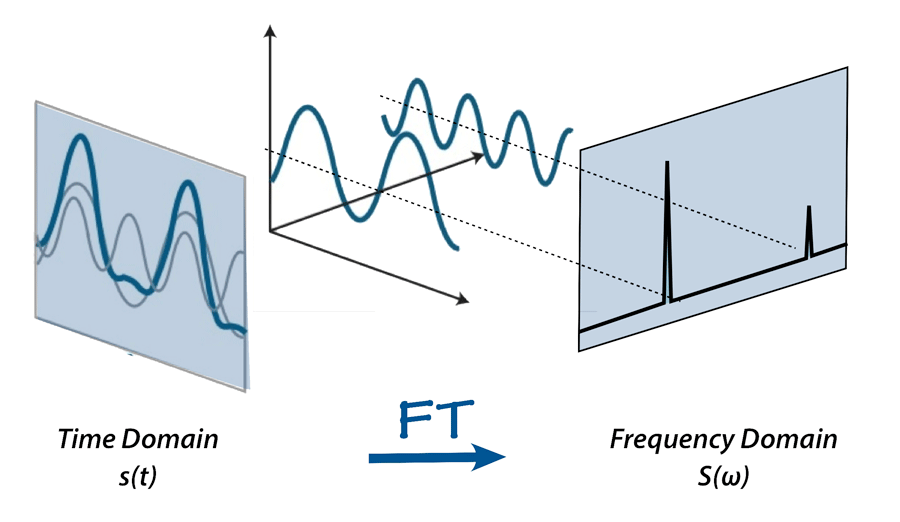

이제 본격적으로 Fourier transform 에 대해 수학적으로 이해해 보자.

$$
y(t)=\sum_{k=-\infty}^\infty A_k \, \exp \left( i\cdot 2\pi\frac{k}{T} t \right)
$$

모든 시간단위의 음성 신호 y(t)는 주파수 단위의 신호의 가중합으로 분해될 수 있다. y(t)는 지수함수 형태의 어떠한 함수와 진폭의 선형결합인 셈이다.

$$
A_k = Amplitude \\
k = Frequency
$$

분명 주파수 단위의 신호와 가중치(여기서는 Amplitude)의 선형결합으로 이루어져야 할 텐데, 주파수 단위의 신호는 위 sinusoidal graphs에서 확인했듯 삼각함수의 형태이다. 우리가 이를 지수함수 형태로 쓸수 있는 것은 Euler's formula(오일러 공식) 때문이다.

$$
e^{i\theta} = \cos{\theta} + i\sin{\theta} \\ ... \\
\exp \left( i\cdot 2\pi\frac{k}{T} t \right) = \cos\left({2\pi\frac{k}{T}}\right) + i\sin\left({2\pi\frac{k}{T}}\right)
$$

## DFT(Discrete Fourier Transform)에 대한 이해

Fourier Transform 에 대해 이해했으나 여전히 의문점이 남는다. 주파수 대역으로 표현한다는 것은 이를테면 110Hz에서의 진폭, 250Hz에서의 진폭... , 9900Hz에서의 진폭과 같이 이산적으로 표현한다는 것일텐데 위 수식대로라면 Sigma의 구간이 무한대이므로 연속적인 꼴을 보인다. 이에 DFT(Discrete Fourier Transform)를 통해 이산적인 주파수 대역 그래프를 만드는 과정을 보인다.

$$
y_n = \frac{1}{N} \sum_{k=0}^{N-1} Y_k \cdot \exp \left( i\cdot 2\pi\frac{k}{N} n \right)
$$

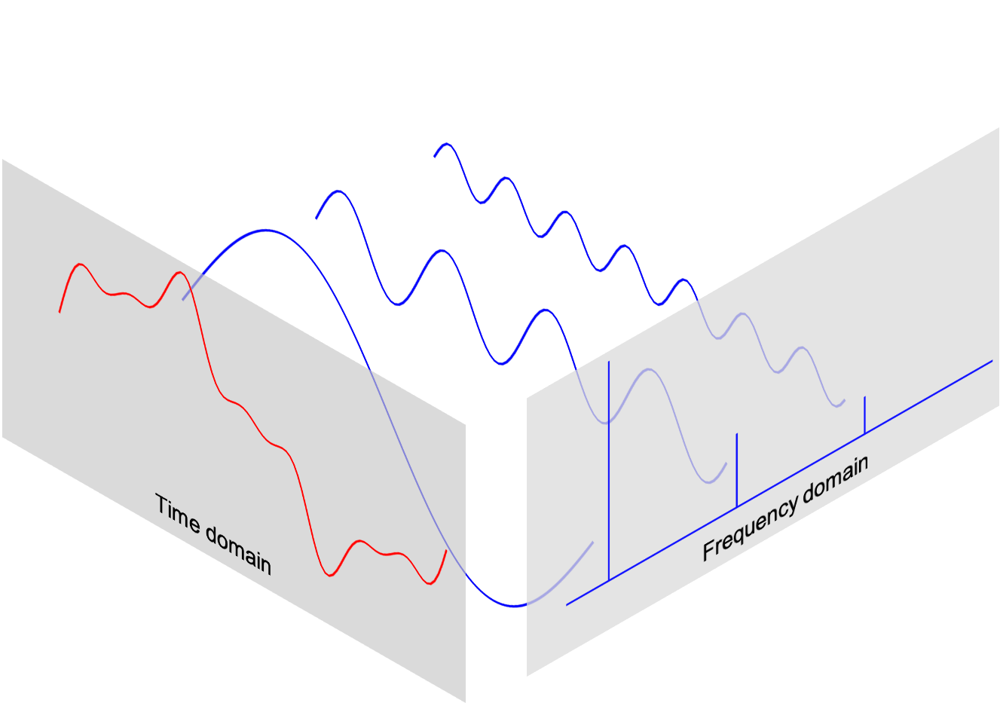

[이미지 출처](https://pythonnumericalmethods.berkeley.edu/notebooks/chapter24.02-Discrete-Fourier-Transform.html)

##STFT(Short Time Fourier Transform)

DFT를 이용해 오디오를 모델링하면 하나의 주파수 대역에 대해 하나의 고정된 진폭(Amplitude)만 부여할 수 있다. 하지만 시간이 지남에 따라 특정 주파수 대역의 진폭이 달라질 수 있고, 이러한 시계열성을 고려하기 위해 STFT라는 알고리즘이 제시되었다. 고정된 길이의 Window 단위로 FFT(Fast Fourier Transform, DFT와 같음)을 수행하여 중첩하는 방식이다. STFT를 거치면 오디오 신호는 매 frame별 DFT의 결과인 Amplitude Ak를 반환하게 된다. 즉 (모든 주파수 대역의 Amplitude, frame의 개수)의 순서쌍이 생기게 되는 것이다.

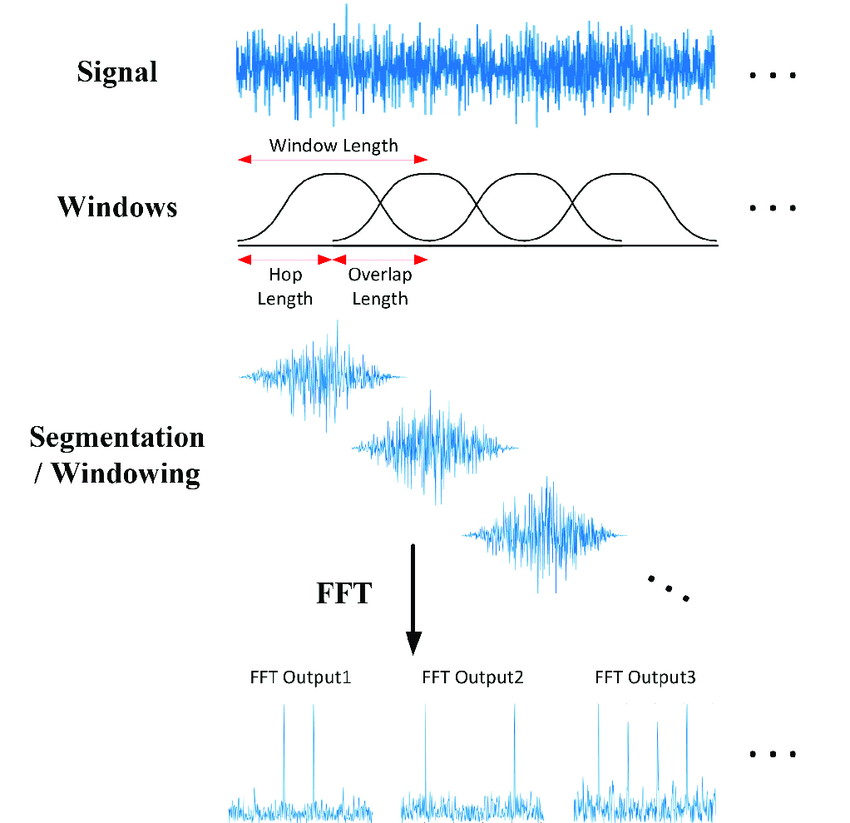

이미지 출처: [ResearchGate](https://www.researchgate.net/figure/Short-time-Fourier-transform-STFT-overview_fig1_346243843)

위 원리를 통해 시간 단위의 음성신호를 주파수 단위로 바꾼 뒤 시간의 정보를 다시 첨가해 준 알고리즘이 STFT(Short Time Fourier Transform)이다. 공식 문서는 [여기](https://librosa.org/doc/main/generated/librosa.stft.html#librosa.stft) 에서 찾아 볼 수 있다.

In [ ]:
"""
n_fft는 매 frame의 길이이다. STFT의 결과 순서쌍의 행의 개수는 ((n_fft/2) + 1) 개이다.
음악 등 일반적인 오디오 신호의 경우에는 2048이 Default이다.
speech processing에서는 512이 좋다.

win_length는 한 프레임에 들어가는 오디오 신호의 개수로 default는 win_length = n_fft이다.
만일 win_length가 n_fft보다 작을 경우 매 프레임마다 win_length 만큼의 오디오 신호를 가운데에 입력한 뒤 n_fft의 개수를 맞추기 위해 나머지 부분을 0으로 padding한다.

hop_length는 매 window가 겹치는 정도를 의미하며 보통 25% 정도 겹치기 때문에 따로 명시하지 않으면 default는 hop_length = win_length/4이다.
"""
#hop_length를 통해 한 위치가 약 4개의 샘플로 생성됨

#위에서 만들었던 A Major 코드(A4, C#4, E5)를 STFT 변환해보자.
y_A = sinusoid(w = 0.4, f0= 220, phi = np.pi/2, fs = fs, time = 2 )
y_CC = any_pitch(4) #음 구현을 통해 만들어짐
y_E = any_pitch(7)
S = librosa.stft((y_A+y_CC+y_E), n_fft = 2048, hop_length = int(1024/4), win_length = 1024)
#라도미의 푸리에 변환을 통한 변환
print(S.shape)
#S의 차원은 (#주파수 대역, #시간 블럭)

(1025, 173)


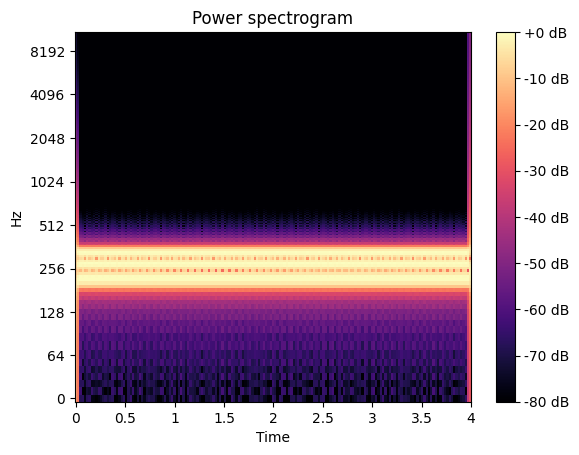

In [ ]:
#그림을 보면 A = 220, C# = 220*(1.05946)^4, E = 220*(1.05946)^7의 부분만 데시벨이 높은 것을 확인할 수 있다.
amplitude = np.abs(S) #Fourier Transform을 통해 추출한 amplitude는 절댓값이 크면 큰 것이기 때문에 크기 정보만 추출하기 위해서 절댓값을 씌워준다. 왜 그런지는 목차의 "오디오 데이터에 대한 이해-위상" 부분을 참고하여 이해할 수 있다.

fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(amplitude,
                                                       ref = np.max),
                               y_axis = 'log', x_axis='time', ax = ax)
#x,y값의 지정 및 추출
ax.set_title('Power spectrogram')
fig.colorbar(img, ax = ax, format = "%+2.0f dB")
#아래의 그림을 Spectrogram이라고 하는데 Spectrogram은 (시간(time), 주파수(Hz), 크기(dB 등))으로 이루어진 3차원 tensor를 그린 그림이다.

##Time-Frequency Localization

win_length는 time-frequency localization trade-off 성질을 지닌다.
즉, win_length가 커질수록 frequency resolution(주파수 해상도)가 높아지는 반면 temporal resolution(시간 해상도)는 낮아진다.
반대로 win_length가 작아질수록 frequency resolution(주파수 해상도)은 낮아지고 temporal resolution(시간 해상도)는 높아진다.
시간에 따른 주파수의 변화에 집중하고 싶다면 win_length를 작게 설정하고 주파수 대역 간 차이에 집중하고 싶다면 win_length를 비교적 크게 설정한다.

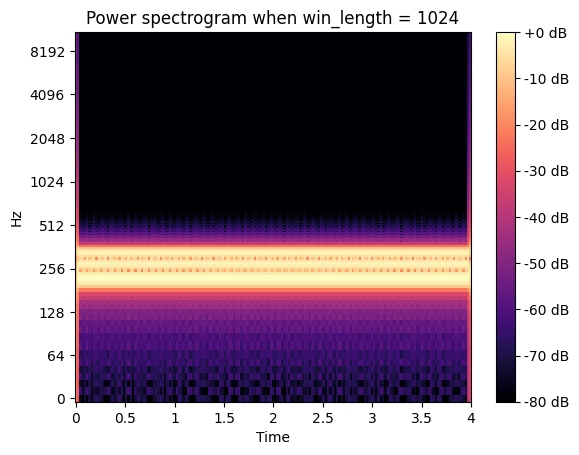

In [ ]:
S = librosa.stft((y_A+y_CC+y_E), n_fft = 2048, hop_length = int(1024/4), win_length = 1024)
#라도미 값의 윈도우 추출
amplitude = np.abs(S)
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(amplitude,
                                                       ref = np.max),
                               y_axis = 'log', x_axis='time', ax = ax)
ax.set_title('Power spectrogram when win_length = 1024')
fig.colorbar(img, ax = ax, format = "%+2.0f dB")

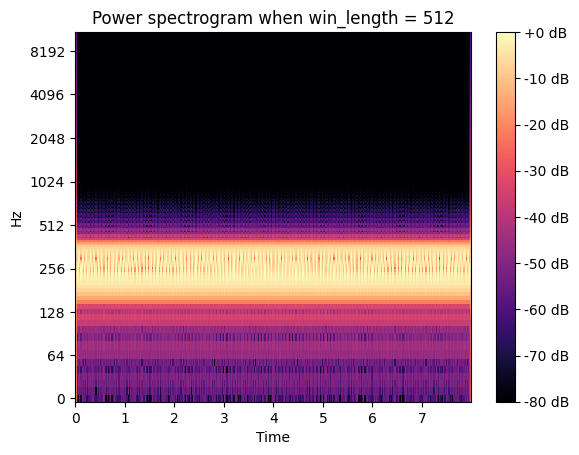

In [ ]:
S = librosa.stft((y_A+y_CC+y_E), n_fft = 2048, hop_length = int(512/4), win_length = 512)
amplitude = np.abs(S)
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(amplitude,
                                                       ref = np.max),
                               y_axis = 'log', x_axis='time', ax = ax)
ax.set_title('Power spectrogram when win_length = 512')
fig.colorbar(img, ax = ax, format = "%+2.0f dB")

**win_length를 1024로 비교적 크게 설정했던 전자가 더 적합한 이유는 우리가 입력한 음성이 A, C#, E 음을 변함없이 계속 출력하고 있는 화음으로, 시간에 따른 변화가 아닌 주파수 대역 간 차이에 집중하는 것이 효과적이기 때문이다.** Time-Frequency Localization에 대한 자세한 설명은 [여기](https://www.sciencedirect.com/science/article/pii/S1063520384710086)에서 확인할 수 있다.




#Mel

인간은 음성을 선형적으로 인식하지 않는다. 낮은 소리의 차이에 대해서는 더 예민하게, 높은 소리의 차이에 대해서는 더 둔감하게 듣는 경향이 있다. 또한 인간이 매 주파수 대역을 연속적으로 인식하는 것이 아니라 주파수 대역 구간을 나누어 범주적으로 (Categorical) 인식한다. 이러한 인간의 주관적인 인지 기준을 반영해 기존의 Linear scale power spectrogram에 멜 변환을 수행해 Mel Spectrogram을 만들게 된다.

Mel scale로 데이터를 전처리하게 되면 딥러닝 모델의 성능이 조금 더 좋아지는(자연스러운) 경향이 있으며 데이터의 크기가 작아지기 때문에 모델 학습 속도 역시 빨라진다.

In [ ]:
#y_low와 y_low2는 110Hz 차이나는 데 굉장히 큰 차이로 느껴진다.
y_low = sinusoid(w_A, f0= 220, phi = np.pi/2, fs = 22050, time = 2.0 )
y_low2 = sinusoid(w_A, f0= 220 + 110, phi = np.pi/2, fs = 22050, time = 2.0)
#각 음에 대해 차이가 발생하는 mel 스케일의 필터차
Audio(data = y_low, rate = 22050)

In [ ]:
Audio(data = y_low2, rate = 22050)

In [ ]:
#y_high와 y_high2 역시 110Hz 차이나는 데 차이가 느껴지지 않는다.
y_high = sinusoid(w_A, f0= 5000, phi = np.pi/2, fs = 22050, time = 2.0 )
y_high2 = sinusoid(w_A, f0= 5000 + 110, phi = np.pi/2, fs = 22050, time = 2.0)
#고주파수 에서의 멜스케일 차이
Audio(data = y_high, rate = 22050)

In [ ]:
Audio(data = y_high2, rate = 22050)

Mel scale 변환의 공식은 다음과 같다. 여기서 f는 STFT의 결과로 특정 시간대의 주파수 대역별 크기(Amplitude)이다.

$$
m = 2595 \log\left(1 + \frac{f}{700}\right)
$$

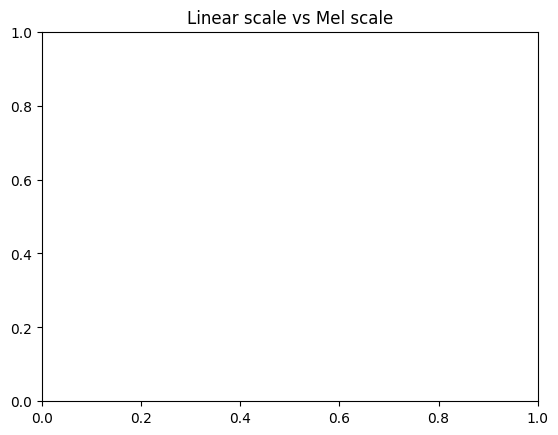

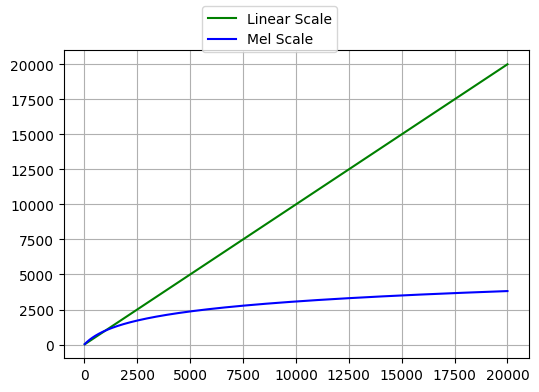

In [ ]:
#인간의 가청 주파수인 20Hz~20,000Hz까지 Mel scale을 linear scale과 비교해 그린 그림이다.
f = np.linspace(20, 20000, 10000)
m = 2595*np.log10(1+f/700)
y1 = f
y2 = m
plt.title("Linear scale vs Mel scale")
fig, ax1 = plt.subplots(figsize=(6
                                ,4))
ax1.plot(f, y1, 'g-', label="Linear Scale")
ax1.plot(f, y2, 'b-', label="Mel Scale")
fig.legend(loc="upper center")
plt.grid()
plt.show()

##Mel Spectrogram

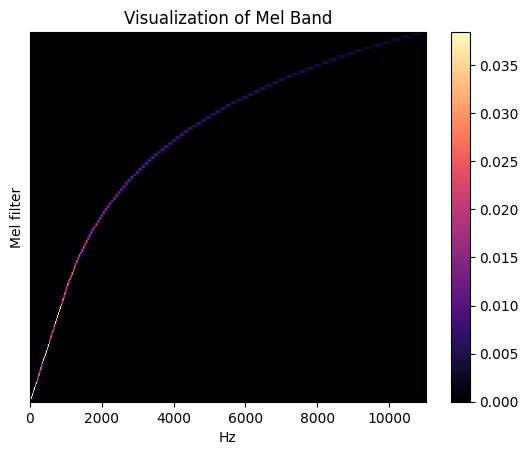

In [ ]:
#Mel Spectrogram은 아래의 Mel scale 개념을 바탕으로 주관적인 인지 능력을 기준으로 하여 만든 Spectrogram이다.
plt.title('Visualization of Mel Band')
mel = librosa.filters.mel(sr = sr, n_fft = 2048, n_mels= 128)
librosa.display.specshow(mel, sr = sr, hop_length = 512, x_axis = 'linear')
plt.ylabel('Mel filter')
plt.colorbar()

Mel scale을 바탕으로 한 위 그림의 Mel band를 제작한 뒤 기존의 spectrogram의 제곱과의 행렬곱(dot product)을 통해 Mel Spectrogram을 만든다. 이 과정은 librosa.feature.melspectrogram 함수를 통해 구현할 수 있다.

(1025, 230)


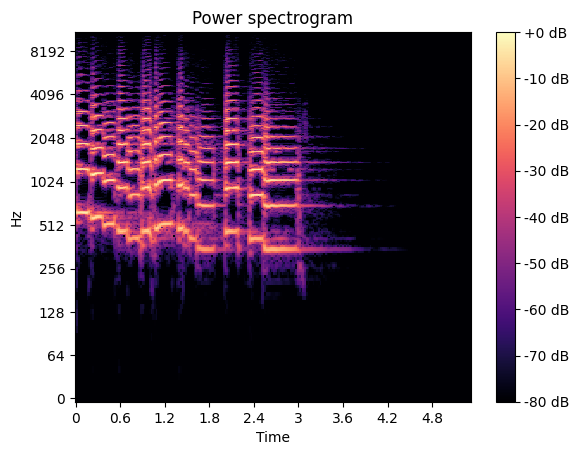

In [ ]:
y, sr = librosa.load(librosa.ex('trumpet'))#librosa의 트럼펫 샘플
S = np.abs(librosa.stft(y))
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(S,
                                                       ref = np.max),
                               y_axis = 'log', x_axis = 'time', ax = ax)
ax.set_title('Power spectrogram') #파워에 따른 볼륨 변화 스펙트로그램화
fig.colorbar(img, ax = ax, format = "%+2.0f dB")
print(S.shape)

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

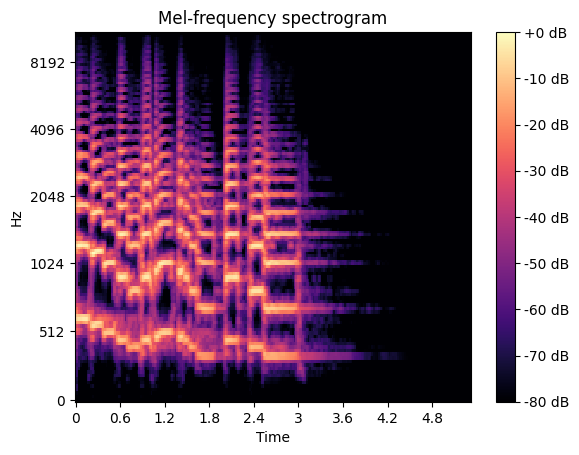

In [ ]:
fig, ax = plt.subplots()

img = librosa.display.specshow(librosa.power_to_db(np.dot(mel, S**2), ref = np.max), x_axis = 'time',
                         y_axis = 'mel', sr = sr,
                          ax = ax)
fig.colorbar(img, ax = ax, format = '%+2.0f dB')
ax.set(title = 'Mel-frequency spectrogram') #아랫부분 날린듯

(128, 230)


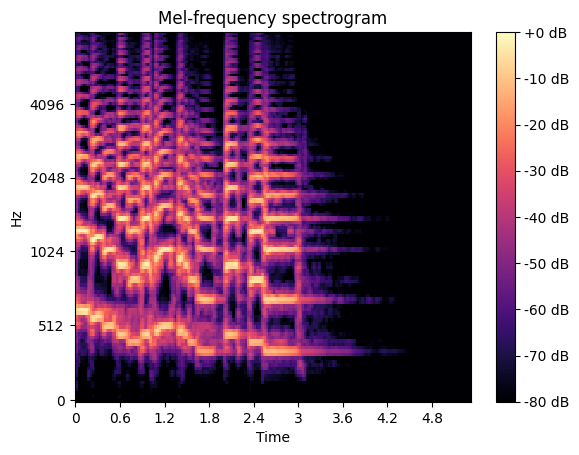

In [ ]:
fig, ax = plt.subplots()
S = librosa.feature.melspectrogram(y = y, sr = sr, n_mels = 128,
                                    fmax = 8000)
S_dB = librosa.power_to_db(S, ref = np.max)
img = librosa.display.specshow(S_dB, x_axis = 'time',
                         y_axis = 'mel', sr = sr,
                         fmax = 8000, ax = ax)
fig.colorbar(img, ax = ax, format = '%+2.0f dB')
ax.set(title = 'Mel-frequency spectrogram')
print(S.shape)

#Speech Data Example

In [ ]:
female = "/content/gdrive/MyDrive/Project/TTS_audiobook/TensorflowTTS/kss*/4/4_0000.wav"
male = "/content/gdrive/MyDrive/Project/TTS_audiobook/TensorflowTTS/kss/4/4_0000.wav"

In [ ]:
y_female, sr = librosa.load(female, sr = 22050)
y_male, sr = librosa.load(male, sr = 22050)
Audio(data = y_male, rate = sr)

<ipython-input-41-48dc6d8afea2>:1: UserWarning: PySoundFile failed. Trying audioread instead.
  y_female, sr = librosa.load(female, sr = 22050)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


FileNotFoundError: [Errno 2] No such file or directory: '/content/gdrive/MyDrive/Project/TTS_audiobook/TensorflowTTS/kss*/4/4_0000.wav'

In [ ]:
Audio(data = y_female, rate = sr)

(128, 95)


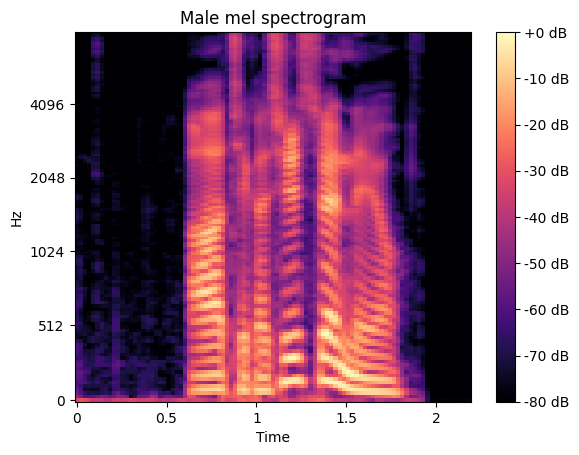

In [ ]:
fig, ax = plt.subplots()
S = librosa.feature.melspectrogram(y=y_male, sr=sr, n_mels=128,
                                    fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Male mel spectrogram')
print(S.shape)

(128, 95)


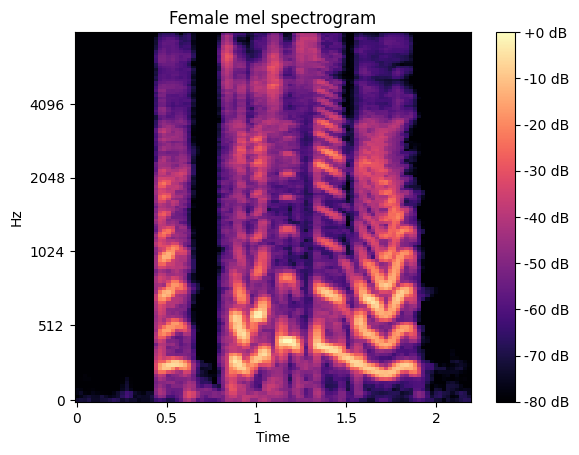

In [ ]:
fig, ax = plt.subplots()
S = librosa.feature.melspectrogram(y=y_female, sr=sr, n_mels=128,
                                    fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Female mel spectrogram')
print(S.shape)

**왜 Mel Spectrogram에서 시간대 별로 나누어 보았을 때 위아래로 일정 간격의 패턴이 반복되는 모습을 보일까?**

자연의 소리는 기본음의 주파수 뿐만 아니라 기본음 주파수의 정수배의 해당하는 주파수를 가진 소리인 고조파(Harmonics)도 함께 가지고 있다. 즉, A4(440Hz)를 피아노 건반에서 연주할 때 이를 Spectrogram으로 표현하면 아래의 그림과 같이 정수배의 주파수들에서 역시 신호를 포착할 수 있다. 따라서 남성, 여성 발화 문장의 Mel Spectrogram에서도 기본음과 고조파들의 신호가 정수배 패턴으로 포착된다.

기본음, 즉 주파수들 중 가장 대역이 낮으면서 음량이 큰 음에 따라 음고가 결정된다. 남성 발화 Mel Spectrogram은 기본음이 100Hz 이하에서 나타나는데 반해 여성 발화 Mel Spectrogram은 기본음이 약 200Hz 근처로 보인다. 이 기본음의 차이 때문에 우리가 두 화자의 발화의 음고 차이를 인식할 수 있는 것이다.

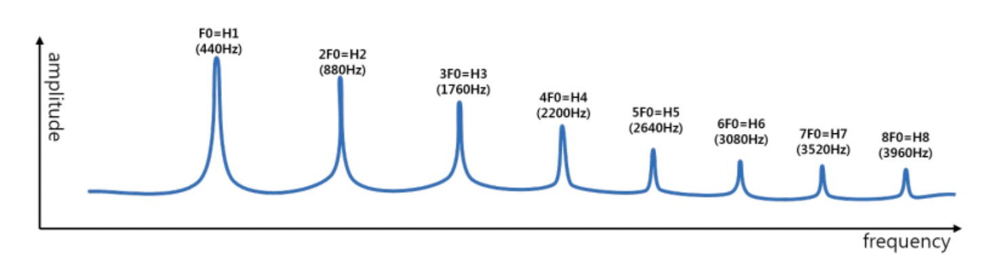

[이미지 출처 및 음향학 추가 설명](http://blog.naver.com/200613241/221137045066)

In [ ]:
#오디오 데이터 변형해보기.
#남성 발화 데이터와 여성 발화 데이터를 산술평균해보기.
y_mean = (y_male[:48128]*y_female)/2
Audio(data = y_mean, rate = sr)

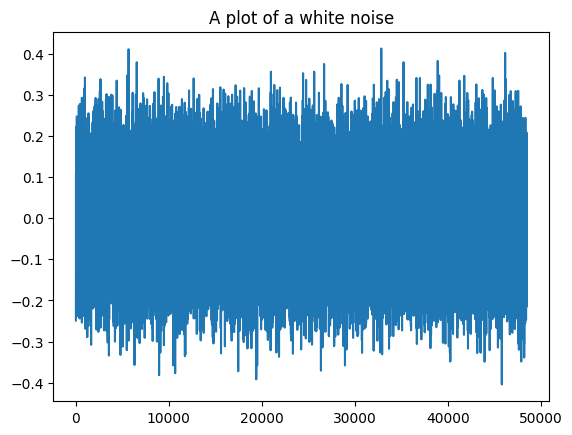

In [ ]:
random_noise = np.random.normal(0, 0.1, 48510)
plt.title("A plot of a white noise")
plt.plot(random_noise)
plt.show()
Audio(data = np.random.normal(0, 0.01, 48510), rate = sr)

#2주차 수업 전까지

CNN: https://yjjo.tistory.com/8

https://www.youtube.com/watch?v=pj9-rr1wDhM

FCN(Fully Connected Layers): https://www.youtube.com/watch?v=rxSmwM7z0_4

https://www.youtube.com/watch?v=Mw3fXO--twg


Softmax: https://gooopy.tistory.com/53#:~:text=%EC%86%8C%ED%94%84%ED%8A%B8%EB%A7%A5%EC%8A%A4%20%ED%95%A8%EC%88%98Softmax%20Function,%EC%86%8D%ED%95%A0%20%ED%99%95%EB%A5%A0%EC%9D%84%20%EC%B6%94%EC%A0%95%ED%95%9C%EB%8B%A4.


학습, 검정, 실험 데이터: https://blog.naver.com/PostView.naver?blogId=bya135&logNo=222223666192&redirect=Dlog&widgetTypeCall=true&directAccess=false